Install and Import Dependencies

In [ ]:
!pip install -q roboflow ultralytics opencv-python matplotlib seaborn pandas scikit-learn pillow

import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
import json
from sklearn.metrics import confusion_matrix, jaccard_score, f1_score
from collections import Counter
import yaml
import torch

# Check GPU availability
print("=" * 60)
print("SYSTEM INFORMATION")
print("=" * 60)
print(f"PyTorch Version: {torch.__version__}")
print(f"CUDA Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA Version: {torch.version.cuda}")
    print(f"GPU Device: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
else:
    print("⚠️ No GPU detected - Training will run on CPU (MUCH slower)")
    print("💡 TIP: In Google Colab, go to Runtime > Change runtime type > GPU")
    print("⚠️ Segmentation models require significant compute power!")
print("=" * 60)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 22.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 59.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 51.1 MB/s eta 0:00:00
SYSTEM INFORMATION
PyTorch Version: 2.9.0+cu126
CUDA Available: True
CUDA Version: 12.6
GPU Device: Tesla T4
GPU Memory: 15.83 GB


Download Dataset from Roboflow

In [ ]:
from roboflow import Roboflow

print("Downloading Vegetation Segmentation Dataset...")
rf = Roboflow(api_key="MMFZWHhSvylkZHBxlS7M")
project = rf.workspace("blue-halo").project("vegetation-segmentation")
version = project.version(4)
dataset = version.download("yolov8")

print(f"Dataset downloaded to: {dataset.location}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to vegetation-segmentation-4 in yolov8:: 100%|██████████| 2148/2148 [00:01<00:00, 1254.50it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Dataset downloaded to: /content/vegetation-segmentation-4


Load Dataset Configuration

In [ ]:
with open(f"{dataset.location}/data.yaml", 'r') as f:
    data_config = yaml.safe_load(f)

print("Dataset Configuration:")
print(f"Number of classes: {data_config['nc']}")
print(f"Class names: {data_config['names']}")
print(f"Train path: {data_config['train']}")
print(f"Valid path: {data_config['val']}")
print(f"Test path: {data_config.get('test', 'Not available')}")

# Define vegetation classes
VEGETATION_CLASSES = data_config['names']
print(f"\nVegetation Classes: {VEGETATION_CLASSES}")

Dataset Configuration:
Number of classes: 1
Class names: ['vegetation']
Train path: ../train/images
Valid path: ../valid/images
Test path: ../test/images

Vegetation Classes: ['vegetation']


EDA - Class Distribution Analysis


=== Class Distribution (Training Set) ===
vegetation: 2511 instances (100.00%)


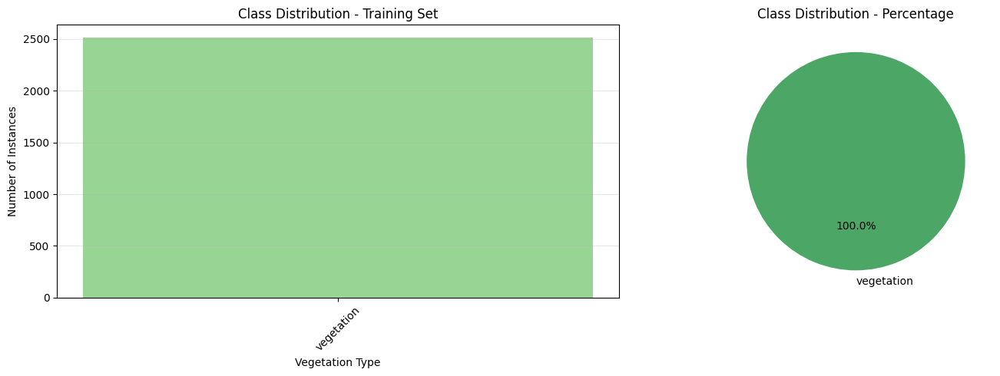

In [ ]:
def analyze_segmentation_class_distribution(labels_path, class_names):
    """Analyze distribution of classes in segmentation masks"""
    class_counts = Counter()
    total_instances = 0

    label_files = list(Path(labels_path).glob('*.txt'))

    for label_file in label_files:
        with open(label_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if line.strip():
                    parts = line.split()
                    class_id = int(parts[0])
                    class_counts[class_id] += 1
                    total_instances += 1

    return class_counts, total_instances

# Define base paths
train_base_path = Path(dataset.location) / 'train'
val_base_path = Path(dataset.location) / 'valid'

# Analyze training set
train_lbl_path = train_base_path / 'labels'
class_counts, total_instances = analyze_segmentation_class_distribution(train_lbl_path, VEGETATION_CLASSES)

print("\n=== Class Distribution (Training Set) ===")
class_data = []
if total_instances > 0: # Ensure there are instances before calculating percentages
    for class_id, count in sorted(class_counts.items()):
        percentage = (count / total_instances) * 100
        class_name = VEGETATION_CLASSES[class_id]
        print(f"{class_name}: {count} instances ({percentage:.2f}%)")
        class_data.append({'Class': class_name, 'Count': count, 'Percentage': percentage})
else:
    print("No instances found for class distribution analysis.")

df_classes = pd.DataFrame(class_data)

# Visualize class distribution
if not df_classes.empty:
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Bar plot
    colors = plt.cm.Greens(np.linspace(0.4, 0.9, len(df_classes)))
    axes[0].bar(df_classes['Class'], df_classes['Count'], color=colors)
    axes[0].set_xlabel('Vegetation Type')
    axes[0].set_ylabel('Number of Instances')
    axes[0].set_title('Class Distribution - Training Set')
    axes[0].tick_params(axis='x', rotation=45)
    axes[0].grid(axis='y', alpha=0.3)

    # Pie chart
    pie_colors = plt.cm.summer(np.linspace(0.3, 0.9, len(df_classes)))
    axes[1].pie(df_classes['Count'], labels=df_classes['Class'], autopct='%1.1f%%',
               colors=pie_colors, startangle=90)
    axes[1].set_title('Class Distribution - Percentage')

    plt.tight_layout()
    plt.savefig('vegetation_class_distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("Cannot visualize class distribution: DataFrame is empty.")

EDA - Image Size Analysis

Analyzing 945 images from /content/vegetation-segmentation-4/train/images

=== Image Dimensions Analysis ===
Images analyzed: 200
Unique dimensions found: 1

All unique sizes:
  1024x1024: 200 images (100.0%)

Statistics:
Average Width: 1024.00 px
Average Height: 1024.00 px
Width Range: 1024 - 1024 px
Height Range: 1024 - 1024 px
Average Aspect Ratio: 1.00
Standard Deviation - Width: 0.00 px
Standard Deviation - Height: 0.00 px

⚠️ NOTE: All images are exactly the same size (1024x1024)
This is likely because Roboflow preprocessed the dataset to a uniform size.
This is actually GOOD for training as YOLOv8 requires consistent input sizes!


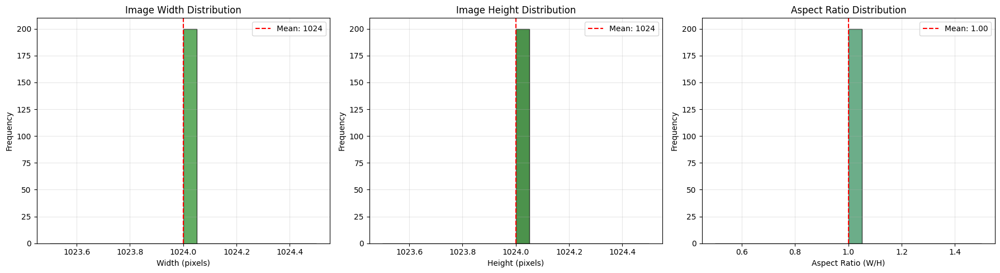

In [ ]:
def analyze_image_sizes(image_path):
    """Analyze dimensions of images"""
    sizes = []
    aspect_ratios = []
    unique_sizes = set()
    img_files = list(Path(image_path).glob('*.jpg')) + list(Path(image_path).glob('*.png')) + list(Path(image_path).glob('*.jpeg'))

    print(f"Analyzing {len(img_files)} images from {image_path}")

    # Sample more images to get better statistics
    sample_size = min(len(img_files), 200)
    sample_files = np.random.choice(img_files, sample_size, replace=False) if len(img_files) > sample_size else img_files

    for img_file in sample_files:
        try:
            img = Image.open(img_file)
            w, h = img.size
            sizes.append((w, h))
            aspect_ratios.append(w / h)
            unique_sizes.add((w, h))
        except Exception as e:
            print(f"Error reading {img_file}: {e}")

    return sizes, aspect_ratios, unique_sizes

# Correcting the train_img_path to use the already established train_base_path
train_img_path = train_base_path / 'images'

image_sizes, aspect_ratios, unique_sizes = analyze_image_sizes(train_img_path)

if len(image_sizes) == 0:
    print("⚠️ No images found for dimension analysis!")
else:
    widths = [s[0] for s in image_sizes]
    heights = [s[1] for s in image_sizes]

    print(f"\n=== Image Dimensions Analysis ===")
    print(f"Images analyzed: {len(image_sizes)}")
    print(f"Unique dimensions found: {len(unique_sizes)}")

    if len(unique_sizes) <= 5:
        print(f"\nAll unique sizes:")
        for size in unique_sizes:
            count = image_sizes.count(size)
            print(f"  {size[0]}x{size[1]}: {count} images ({count/len(image_sizes)*100:.1f}%)")

    print(f"\nStatistics:")
    print(f"Average Width: {np.mean(widths):.2f} px")
    print(f"Average Height: {np.mean(heights):.2f} px")
    print(f"Width Range: {min(widths)} - {max(widths)} px")
    print(f"Height Range: {min(heights)} - {max(heights)} px")
    print(f"Average Aspect Ratio: {np.mean(aspect_ratios):.2f}")
    print(f"Standard Deviation - Width: {np.std(widths):.2f} px")
    print(f"Standard Deviation - Height: {np.std(heights):.2f} px")

    # Check if all images are the same size
    if len(unique_sizes) == 1:
        print(f"\n⚠️ NOTE: All images are exactly the same size ({list(unique_sizes)[0][0]}x{list(unique_sizes)[0][1]})")
        print("This is likely because Roboflow preprocessed the dataset to a uniform size.")
        print("This is actually GOOD for training as YOLOv8 requires consistent input sizes!")

    # Visualize image dimensions and aspect ratios
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    axes[0].hist(widths, bins=20, color='forestgreen', edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Width (pixels)')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('Image Width Distribution')
    axes[0].axvline(np.mean(widths), color='red', linestyle='--', label=f'Mean: {np.mean(widths):.0f}')
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    axes[1].hist(heights, bins=20, color='darkgreen', edgecolor='black', alpha=0.7)
    axes[1].set_xlabel('Height (pixels)')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title('Image Height Distribution')
    axes[1].axvline(np.mean(heights), color='red', linestyle='--', label=f'Mean: {np.mean(heights):.0f}')
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    axes[2].hist(aspect_ratios, bins=20, color='seagreen', edgecolor='black', alpha=0.7)
    axes[2].set_xlabel('Aspect Ratio (W/H)')
    axes[2].set_ylabel('Frequency')
    axes[2].set_title('Aspect Ratio Distribution')
    axes[2].axvline(np.mean(aspect_ratios), color='red', linestyle='--', label=f'Mean: {np.mean(aspect_ratios):.2f}')
    axes[2].legend()
    axes[2].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig('vegetation_image_dimensions.png', dpi=300, bbox_inches='tight')
    plt.show()

EDA - Polygon Complexity Analysis


=== Polygon Complexity Analysis ===
Average points per polygon: 22.15
Min points: 5
Max points: 86
Median points: 18.00


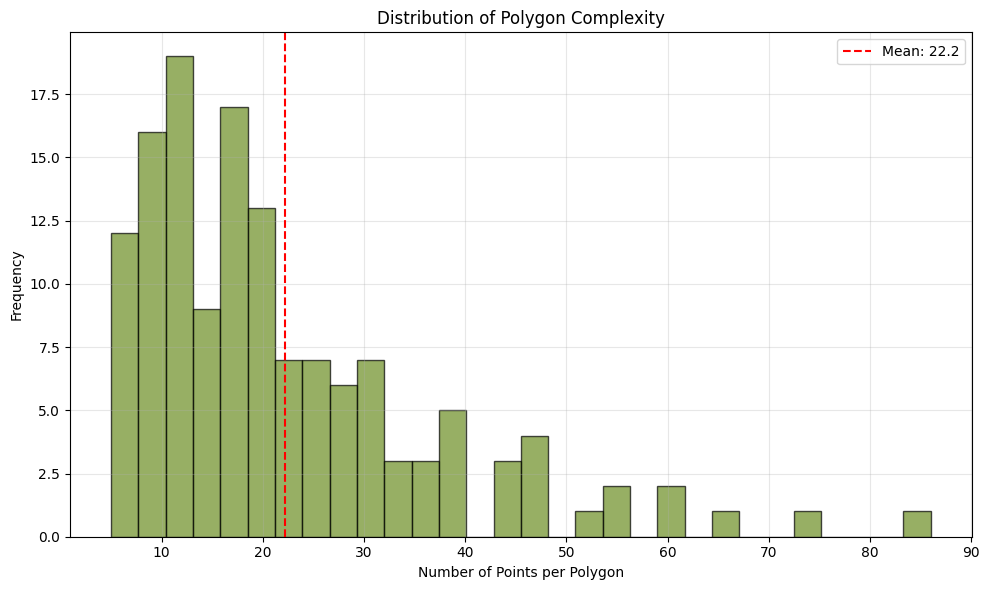

In [ ]:
def analyze_polygon_complexity(labels_path):
    """Analyze complexity of segmentation polygons"""
    polygon_points = []

    label_files = list(Path(labels_path).glob('*.txt'))[:50]  # Sample 50 files

    for label_file in label_files:
        with open(label_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if line.strip():
                    parts = line.split()
                    # First element is class, rest are coordinates
                    num_points = (len(parts) - 1) // 2
                    polygon_points.append(num_points)

    return polygon_points

polygon_complexity = analyze_polygon_complexity(train_lbl_path)

print(f"\n=== Polygon Complexity Analysis ===")
print(f"Average points per polygon: {np.mean(polygon_complexity):.2f}")
print(f"Min points: {min(polygon_complexity)}")
print(f"Max points: {max(polygon_complexity)}")
print(f"Median points: {np.median(polygon_complexity):.2f}")

plt.figure(figsize=(10, 6))
plt.hist(polygon_complexity, bins=30, color='olivedrab', edgecolor='black', alpha=0.7)
plt.xlabel('Number of Points per Polygon')
plt.ylabel('Frequency')
plt.title('Distribution of Polygon Complexity')
plt.axvline(np.mean(polygon_complexity), color='red', linestyle='--',
           label=f'Mean: {np.mean(polygon_complexity):.1f}')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('polygon_complexity.png', dpi=300, bbox_inches='tight')
plt.show()

Visualize Sample Images with Segmentation Masks


=== Sample Images with Segmentation Masks ===


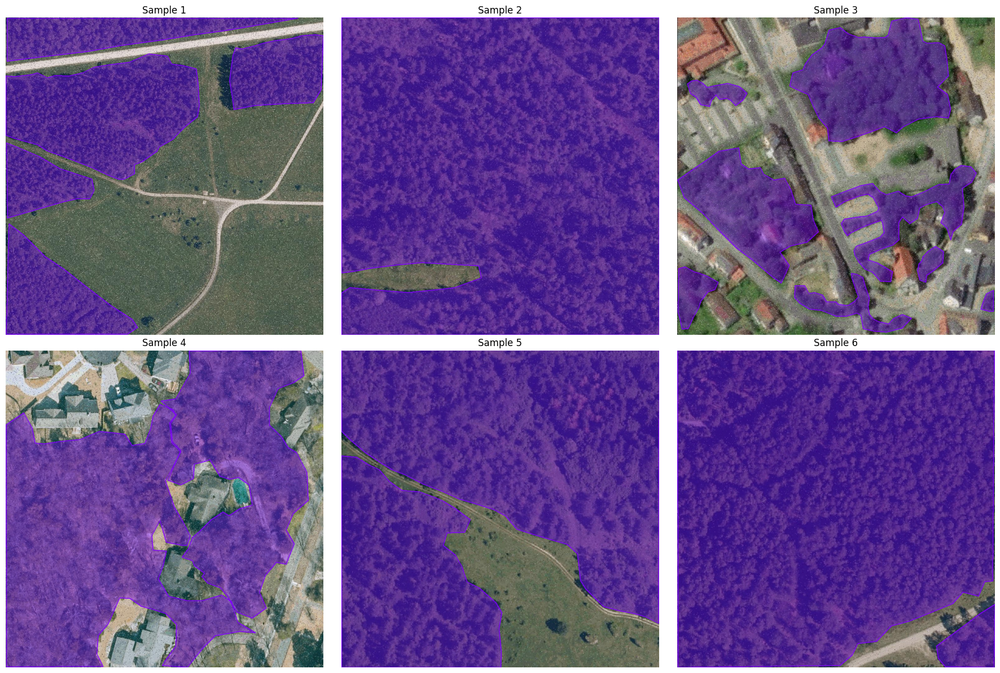

In [ ]:
def visualize_segmentation_samples(data_path, class_names, num_samples=6):
    """Visualize sample images with segmentation masks"""
    img_path = Path(data_path) / 'images'
    lbl_path = Path(data_path) / 'labels'

    img_files = list(img_path.glob('*.jpg')) + list(img_path.glob('*.png'))

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    colors_map = plt.cm.rainbow(np.linspace(0, 1, len(class_names)))

    for idx, img_file in enumerate(img_files[:num_samples]):
        img = cv2.imread(str(img_file))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Create overlay
        overlay = img.copy()

        lbl_file = lbl_path / f"{img_file.stem}.txt"

        if lbl_file.exists():
            with open(lbl_file, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    if line.strip():
                        parts = line.split()
                        class_id = int(parts[0])
                        coords = list(map(float, parts[1:]))

                        # Convert normalized coordinates to pixel coordinates
                        points = []
                        for i in range(0, len(coords), 2):
                            x = int(coords[i] * w)
                            y = int(coords[i+1] * h)
                            points.append([x, y])

                        points = np.array(points, dtype=np.int32)

                        # Draw filled polygon
                        color = (np.array(colors_map[class_id][:3]) * 255).astype(int)
                        cv2.fillPoly(overlay, [points], color.tolist())

                        # Draw polygon outline
                        cv2.polylines(img, [points], True, color.tolist(), 2)

        # Blend overlay with original image
        result = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

        axes[idx].imshow(result)
        axes[idx].set_title(f"Sample {idx+1}")
        axes[idx].axis('off')

    plt.tight_layout()
    plt.savefig('vegetation_sample_masks.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n=== Sample Images with Segmentation Masks ===")
visualize_segmentation_samples(train_base_path, VEGETATION_CLASSES)

Train YOLOv8 Segmentation Model

In [ ]:
from ultralytics import YOLO
import torch

print("\n=== Training YOLOv8 Segmentation Model ===")

# Check for GPU availability
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")
if device == 'cpu':
    print("⚠️ WARNING: Training on CPU. This will be MUCH slower than GPU training.")
    print("Consider using Google Colab with GPU runtime for faster training.")
    print("Segmentation models are particularly compute-intensive on CPU.")

# Initialize segmentation model
model = YOLO('yolov8n-seg.pt')  # Nano segmentation model

# Train the model
EPOCHS = 25

print(f"Training for {EPOCHS} epochs...")

results = model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=EPOCHS,
    imgsz=640,
    batch=16 if device == 'cuda:0' else 4,  # Much smaller batch for CPU with segmentation
    name='vegetation_segmentation',
    patience=10,  # Early stopping if no improvement
    save=True,
    plots=True,
    device=device  # Use detected device
)

print("Training completed!")


=== Training YOLOv8 Segmentation Model ===
Using device: cuda:0
Training for 25 epochs...
Ultralytics 8.3.246 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vegetation-segmentation-4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=vegetation_segmentation, nbs=6

Regression Task

In [ ]:
import pandas as pd
import numpy as np

np.random.seed(42)
n_samples = 100
features = {
    'feature1': np.random.rand(n_samples) * 100,
    'feature2': np.random.rand(n_samples) * 50,
    'feature3': np.random.randint(0, 5, n_samples),
    'feature4': np.random.normal(loc=10, scale=2, size=n_samples)
}
# Target variable (e.g., price, score, etc.)
target = 2 * features['feature1'] + 0.5 * features['feature2'] + 10 * features['feature3'] + np.random.normal(loc=0, scale=5, size=n_samples)

df_sample = pd.DataFrame(features)
df_sample['target'] = target

# Save the dummy data to a CSV file
dataset_path = 'regression_data.csv'
df_sample.to_csv(dataset_path, index=False)

print(f"Sample dataset '{dataset_path}' created successfully.")

# Load the dataset into a pandas DataFrame
try:
    df = pd.read_csv(dataset_path)
    print(f"Dataset '{dataset_path}' loaded successfully.")
    print("First 5 rows of the DataFrame:")
    print(df.head())
except FileNotFoundError:
    print(f"Error: The file '{dataset_path}' was not found. Please ensure the path is correct.")
except Exception as e:
    print(f"An error occurred while loading the dataset: {e}")

Sample dataset 'regression_data.csv' created successfully.
Dataset 'regression_data.csv' loaded successfully.
First 5 rows of the DataFrame:
    feature1   feature2  feature3   feature4      target
0  37.454012   1.571459         3  10.299667  107.316345
1  95.071431  31.820521         2  10.281815  234.429588
2  73.199394  15.717799         0  10.708839  158.702609
3  59.865848  25.428535         3   6.239375  164.926285
4  15.601864  45.378324         3  11.932784   84.170751


In [ ]:
from sklearn.model_selection import train_test_split

print("\n=== Data Preprocessing for Regression ===\n")

# 1. Separate features (X) and target variable (y)
X = df.drop('target', axis=1)
y = df['target']

print("Features (X) and target (y) separated.")
print(f"Shape of X: {X.shape}")
print(f"Shape of y: {y.shape}")

# 2. Check for missing values
print("\nChecking for missing values...")
missing_values_X = X.isnull().sum()
missing_values_y = y.isnull().sum()

if missing_values_X.sum() == 0 and missing_values_y.sum() == 0:
    print("No missing values found in features or target.")
else:
    print("Missing values found:")
    if missing_values_X.sum() > 0:
        print("Features with missing values:\n", missing_values_X[missing_values_X > 0])
    if missing_values_y.sum() > 0:
        print("Target with missing values:\n", missing_values_y[missing_values_y > 0])

# 3. Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nData split into training and testing sets.")
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")


=== Data Preprocessing for Regression ===

Features (X) and target (y) separated.
Shape of X: (100, 4)
Shape of y: (100,)

Checking for missing values...
No missing values found in features or target.

Data split into training and testing sets.
X_train shape: (80, 4)
X_test shape: (20, 4)
y_train shape: (80,)
y_test shape: (20,)


XG Boost

In [ ]:
import xgboost as xgb

print("\n=== Training XGBoost Regressor ===\n")

# 1. Initialize an XGBoost Regressor model
# Using some common parameters as a starting point
# random_state is set for reproducibility
xgb_model = xgb.XGBRegressor(
    n_estimators=100,      # Number of boosting rounds
    learning_rate=0.1,     # Step size shrinkage to prevent overfitting
    max_depth=5,           # Maximum depth of a tree
    random_state=42        # For reproducible results
)

print("XGBoost Regressor model initialized.")
print(f"Model parameters: {xgb_model.get_params()}")

# 2. Train the XGBoost model
xgb_model.fit(X_train, y_train)

print("XGBoost Regressor model trained successfully on the training data.")


=== Training XGBoost Regressor ===

XGBoost Regressor model initialized.
Model parameters: {'objective': 'reg:squarederror', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': None, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 5, 'max_leaves': None, 'min_child_weight': None, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 100, 'n_jobs': None, 'num_parallel_tree': None, 'random_state': 42, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': None, 'tree_method': None, 'validate_parameters': None, 'verbosi

In [ ]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

print("\n=== Evaluating XGBoost Model ===\n")

# 1. Make predictions on the test set
y_pred = xgb_model.predict(X_test)

print("Predictions made on the test set.")

# 2. Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error (MAE): {mae:.4f}")

# 3. Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse:.4f}")

# 4. Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# 5. Calculate R-squared (R2) Score
r2 = r2_score(y_test, y_pred)
print(f"R-squared (R2) Score: {r2:.4f}")


=== Evaluating XGBoost Model ===

Predictions made on the test set.
Mean Absolute Error (MAE): 11.4731
Mean Squared Error (MSE): 194.1407
Root Mean Squared Error (RMSE): 13.9334
R-squared (R2) Score: 0.9559



=== Visualizing Regression Results ===



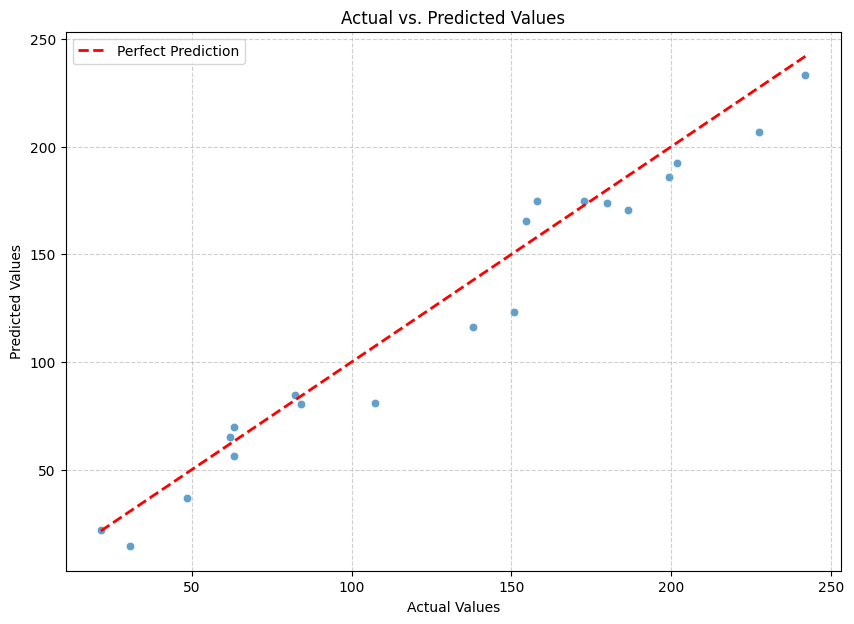

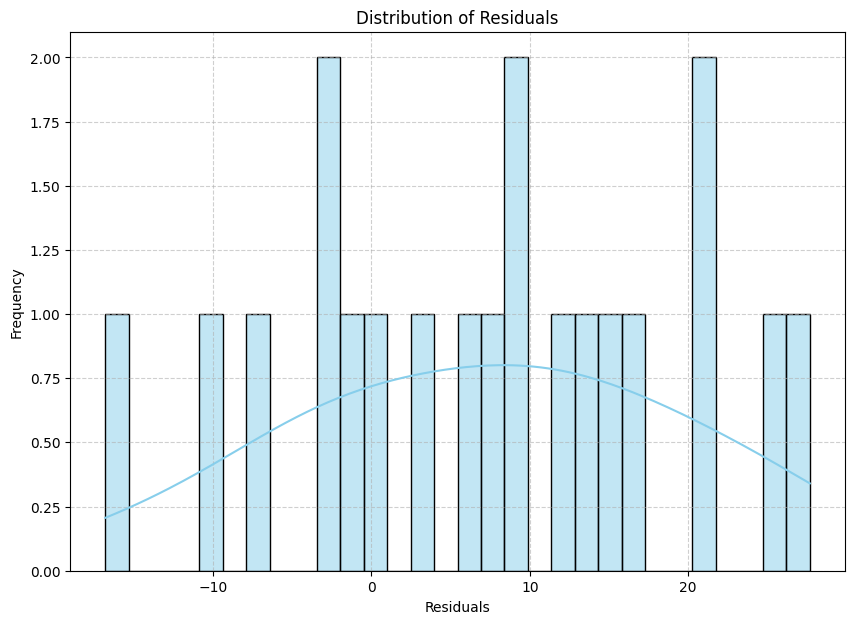

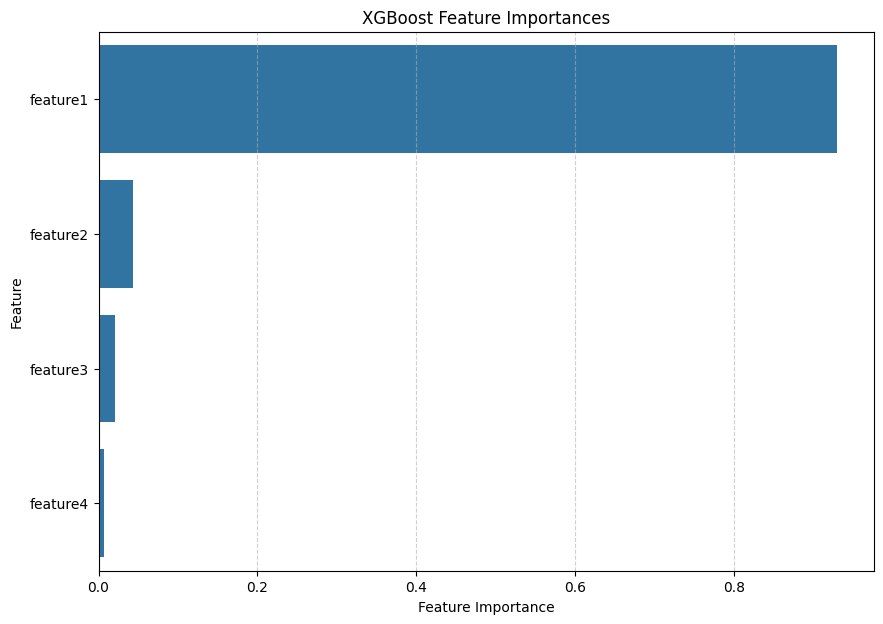

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

print("\n=== Visualizing Regression Results ===\n")

# 1. Scatter plot of Actual vs. Predicted Values
plt.figure(figsize=(10, 7))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Perfect Prediction')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 2. Histogram of Residuals
residuals = y_test - y_pred
plt.figure(figsize=(10, 7))
sns.histplot(residuals, kde=True, bins=30, color='skyblue')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# 3. Feature Importance Plot
if hasattr(xgb_model, 'feature_importances_'):
    feature_importances = pd.Series(xgb_model.feature_importances_, index=X.columns)
    plt.figure(figsize=(10, 7))
    sns.barplot(x=feature_importances.sort_values(ascending=False), y=feature_importances.index.map(str))
    plt.xlabel('Feature Importance')
    plt.ylabel('Feature')
    plt.title('XGBoost Feature Importances')
    plt.grid(axis='x', linestyle='--', alpha=0.6)
    plt.show()
else:
    print("Feature importances not available for this model type.")

Load Best Model and Validate

In [ ]:
print("\n=== Model Validation ===")

# Check if training was successful and model exists
model_path = Path('runs/segment/vegetation_segmentation/weights/best.pt')

if not model_path.exists():
    print("❌ ERROR: Trained model not found!")
    print(f"Expected location: {model_path}")
    print("\nPossible reasons:")
    print("1. Training cell (Cell 9) was not executed")
    print("2. Training failed or was interrupted")
    print("3. Model was saved to a different location")

    # Search for any trained models
    print("\nSearching for trained models...")
    runs_dir = Path('runs/segment')
    if runs_dir.exists():
        model_files = list(runs_dir.rglob('best.pt'))
        if model_files:
            print(f"Found {len(model_files)} trained model(s):")
            for mf in model_files:
                print(f"  - {mf}")
            print("\nUpdate the model_path variable to use one of these models.")
        else:
            print("No trained models found in runs/segment/")
    else:
        print("runs/segment/ directory not found. Training may not have started.")

    print("\n⚠️ Skipping validation. Please train the model first (Cell 9).")
    best_model = None
    val_results = None
else:
    # Load best model
    best_model = YOLO(str(model_path))
    print(f"✅ Model loaded from: {model_path}")

    # Validate on validation set
    val_results = best_model.val(data=f"{dataset.location}/data.yaml")

    print(f"\nValidation Results:")
    print(f"Box mAP50: {val_results.box.map50:.4f}")
    print(f"Box mAP50-95: {val_results.box.map:.4f}")
    print(f"Mask mAP50: {val_results.seg.map50:.4f}")
    print(f"Mask mAP50-95: {val_results.seg.map:.4f}")
    print(f"Precision: {val_results.box.mp:.4f}")
    print(f"Recall: {val_results.box.mr:.4f}")


=== Model Validation ===
✅ Model loaded from: runs/segment/vegetation_segmentation/weights/best.pt
Ultralytics 8.3.246 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-seg summary (fused): 85 layers, 3,258,259 parameters, 0 gradients, 11.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2479.6±784.3 MB/s, size: 133.2 KB)
val: Scanning /content/vegetation-segmentation-4/valid/labels.cache... 83 images, 10 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 83/83 172.4Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.1it/s 5.3s
                   all         83        205      0.791      0.561      0.711      0.483       0.77      0.605      0.727      0.457
Speed: 10.1ms preprocess, 11.0ms inference, 0.1ms loss, 9.9ms postprocess per image
Results saved to /content/runs/segment/val

Validation Results:
Box mAP50: 0.7109
Box mAP50-95: 0.4829
Mask mA

Calculate IoU and Dice Scores


=== Calculating IoU and Dice Scores ===
Processing 50 validation images...
Mean IoU Score: 0.7974
Mean Dice Score: 0.7033


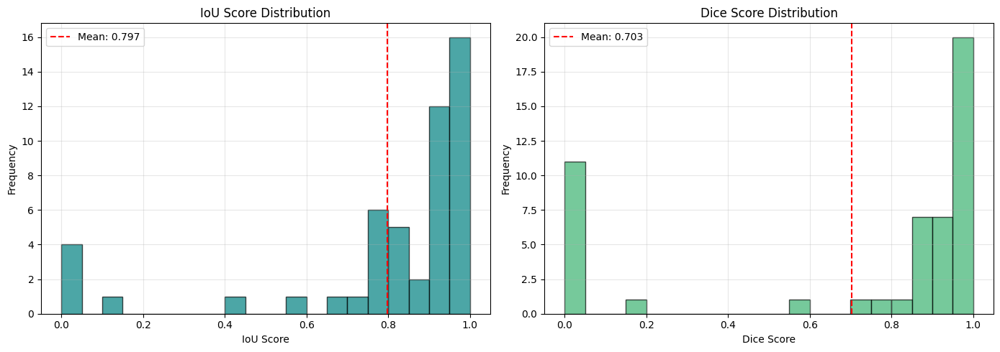

In [ ]:
if best_model is None:
    print("⚠️ Skipping IoU/Dice calculation - No trained model available.")
    print("Please complete training in Cell 9 first.")
    iou_scores = []
    dice_scores = []
else:
    def calculate_iou_dice(pred_mask, true_mask):
        """Calculate IoU and Dice score for binary masks"""
        intersection = np.logical_and(pred_mask, true_mask).sum()
        union = np.logical_or(pred_mask, true_mask).sum()

        if union == 0:
            iou = 1.0 if intersection == 0 else 0.0
        else:
            iou = intersection / union

        dice = (2 * intersection) / (pred_mask.sum() + true_mask.sum()) if (pred_mask.sum() + true_mask.sum()) > 0 else 0.0

        return iou, dice

    # Calculate metrics on validation set
    val_img_path = val_base_path / 'images'
    val_lbl_path = val_base_path / 'labels'

    iou_scores = []
    dice_scores = []

    val_images = list(val_img_path.glob('*.jpg')) + list(val_img_path.glob('*.png')) + list(val_img_path.glob('*.jpeg'))
    val_images = val_images[:50]  # Process 50 images

    print("\n=== Calculating IoU and Dice Scores ===")
    print(f"Processing {len(val_images)} validation images...")

    for img_file in val_images:
        img = cv2.imread(str(img_file))
        if img is None:
            continue
        h, w = img.shape[:2]

        # Get ground truth mask
        lbl_file = val_lbl_path / f"{img_file.stem}.txt"
        true_mask = np.zeros((h, w), dtype=np.uint8)

        if lbl_file.exists():
            with open(lbl_file, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    if line.strip():
                        parts = line.split()
                        coords = list(map(float, parts[1:]))

                        points = []
                        for i in range(0, len(coords), 2):
                            x = int(coords[i] * w)
                            y = int(coords[i+1] * h)
                            points.append([x, y])

                        points = np.array(points, dtype=np.int32)
                        cv2.fillPoly(true_mask, [points], 1)

        # Get prediction mask
        results = best_model.predict(str(img_file), verbose=False)
        pred_mask = np.zeros((h, w), dtype=np.uint8)

        for result in results:
            if result.masks is not None:
                for mask in result.masks.data:
                    mask_resized = cv2.resize(mask.cpu().numpy(), (w, h))
                    pred_mask = np.logical_or(pred_mask, mask_resized > 0.5).astype(np.uint8)

        # Calculate metrics
        iou, dice = calculate_iou_dice(pred_mask, true_mask)
        iou_scores.append(iou)
        dice_scores.append(dice)

    if len(iou_scores) > 0:
        print(f"Mean IoU Score: {np.mean(iou_scores):.4f}")
        print(f"Mean Dice Score: {np.mean(dice_scores):.4f}")
    else:
        print("⚠️ No scores calculated - check validation images.")

# Visualize IoU and Dice distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].hist(iou_scores, bins=20, color='teal', edgecolor='black', alpha=0.7)
axes[0].set_xlabel('IoU Score')
axes[0].set_ylabel('Frequency')
axes[0].set_title('IoU Score Distribution')
axes[0].axvline(np.mean(iou_scores), color='red', linestyle='--', label=f'Mean: {np.mean(iou_scores):.3f}')
axes[0].legend()
axes[0].grid(alpha=0.3)

axes[1].hist(dice_scores, bins=20, color='mediumseagreen', edgecolor='black', alpha=0.7)
axes[1].set_xlabel('Dice Score')
axes[1].set_ylabel('Frequency')
axes[1].set_title('Dice Score Distribution')
axes[1].axvline(np.mean(dice_scores), color='red', linestyle='--', label=f'Mean: {np.mean(dice_scores):.3f}')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.savefig('iou_dice_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

Confusion Matrix for Pixel Classification


=== Generating Pixel-Level Confusion Matrix ===


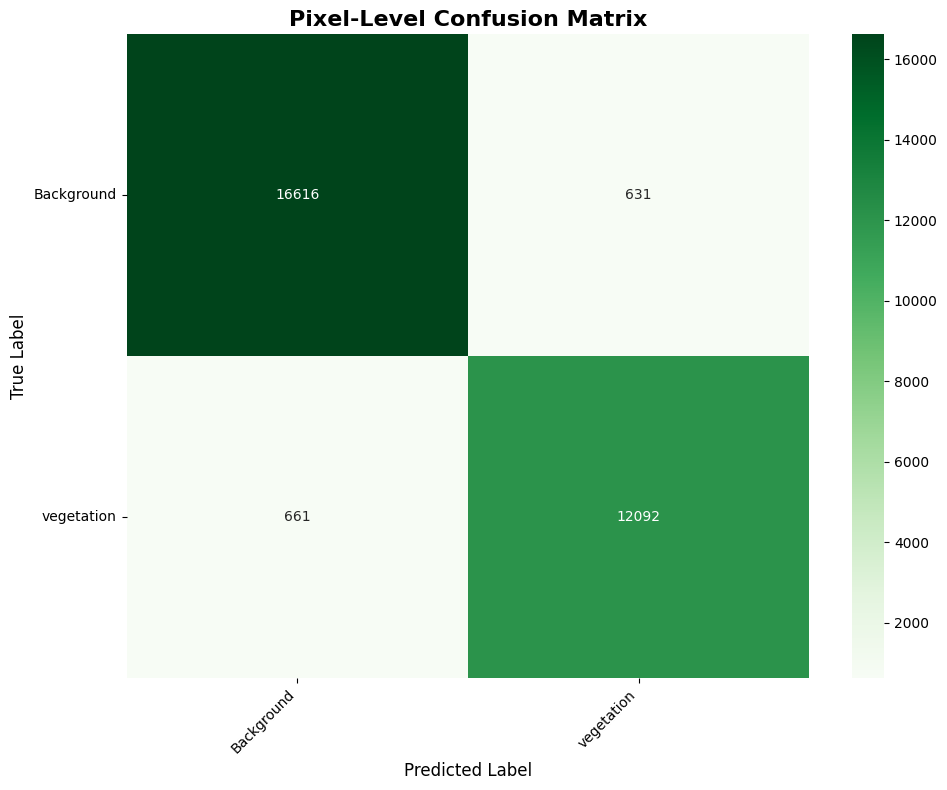

In [ ]:
print("\n=== Generating Pixel-Level Confusion Matrix ===")

# Collect pixel-level predictions
all_true_pixels = []
all_pred_pixels = []

for img_file in val_images[:30]:  # Process 30 images for confusion matrix
    img = cv2.imread(str(img_file))
    h, w = img.shape[:2]

    # Ground truth
    lbl_file = val_lbl_path / f"{img_file.stem}.txt"
    true_mask = np.zeros((h, w), dtype=np.int32)

    if lbl_file.exists():
        with open(lbl_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                if line.strip():
                    parts = line.split()
                    class_id = int(parts[0]) + 1  # 0 is background
                    coords = list(map(float, parts[1:]))

                    points = []
                    for i in range(0, len(coords), 2):
                        x = int(coords[i] * w)
                        y = int(coords[i+1] * h)
                        points.append([x, y])

                    points = np.array(points, dtype=np.int32)
                    cv2.fillPoly(true_mask, [points], class_id)

    # Prediction
    results = best_model.predict(str(img_file), verbose=False)
    pred_mask = np.zeros((h, w), dtype=np.int32)

    for result in results:
        if result.masks is not None:
            for i, mask in enumerate(result.masks.data):
                mask_resized = cv2.resize(mask.cpu().numpy(), (w, h))
                class_id = int(result.boxes.cls[i].item()) + 1
                pred_mask[mask_resized > 0.5] = class_id

    # Sample pixels (reduce memory usage)
    sample_indices = np.random.choice(h * w, min(1000, h * w), replace=False)
    all_true_pixels.extend(true_mask.flatten()[sample_indices])
    all_pred_pixels.extend(pred_mask.flatten()[sample_indices])

# Create confusion matrix
class_labels = ['Background'] + VEGETATION_CLASSES
cm = confusion_matrix(all_true_pixels, all_pred_pixels,
                     labels=range(len(class_labels)))

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_labels,
            yticklabels=class_labels)
plt.title('Pixel-Level Confusion Matrix', fontsize=16, fontweight='bold')
plt.ylabel('True Label', fontsize=12)
plt.xlabel('Predicted Label', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('vegetation_confusion_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

Visualize Training Metrics

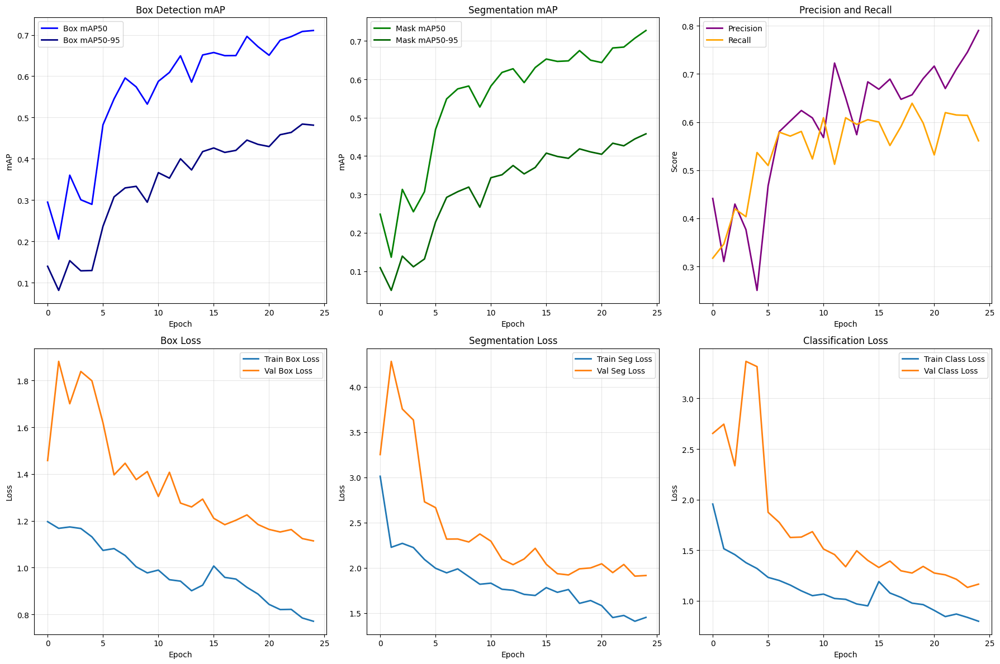

In [ ]:
results_dir = Path('runs/segment/vegetation_segmentation')

if (results_dir / 'results.csv').exists():
    df_results = pd.read_csv(results_dir / 'results.csv')
    df_results.columns = df_results.columns.str.strip()

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))

    # Plot Box mAP
    if 'metrics/mAP50(B)' in df_results.columns:
        axes[0, 0].plot(df_results['metrics/mAP50(B)'], label='Box mAP50', linewidth=2, color='blue')
        axes[0, 0].plot(df_results['metrics/mAP50-95(B)'], label='Box mAP50-95', linewidth=2, color='navy')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('mAP')
        axes[0, 0].set_title('Box Detection mAP')
        axes[0, 0].legend()
        axes[0, 0].grid(alpha=0.3)

    # Plot Mask mAP
    if 'metrics/mAP50(M)' in df_results.columns:
        axes[0, 1].plot(df_results['metrics/mAP50(M)'], label='Mask mAP50', linewidth=2, color='green')
        axes[0, 1].plot(df_results['metrics/mAP50-95(M)'], label='Mask mAP50-95', linewidth=2, color='darkgreen')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('mAP')
        axes[0, 1].set_title('Segmentation mAP')
        axes[0, 1].legend()
        axes[0, 1].grid(alpha=0.3)

    # Plot Precision and Recall
    if 'metrics/precision(B)' in df_results.columns:
        axes[0, 2].plot(df_results['metrics/precision(B)'], label='Precision', linewidth=2, color='purple')
        axes[0, 2].plot(df_results['metrics/recall(B)'], label='Recall', linewidth=2, color='orange')
        axes[0, 2].set_xlabel('Epoch')
        axes[0, 2].set_ylabel('Score')
        axes[0, 2].set_title('Precision and Recall')
        axes[0, 2].legend()
        axes[0, 2].grid(alpha=0.3)

    # Plot Box Loss
    if 'train/box_loss' in df_results.columns:
        axes[1, 0].plot(df_results['train/box_loss'], label='Train Box Loss', linewidth=2)
        axes[1, 0].plot(df_results['val/box_loss'], label='Val Box Loss', linewidth=2)
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Loss')
        axes[1, 0].set_title('Box Loss')
        axes[1, 0].legend()
        axes[1, 0].grid(alpha=0.3)

    # Plot Segmentation Loss
    if 'train/seg_loss' in df_results.columns:
        axes[1, 1].plot(df_results['train/seg_loss'], label='Train Seg Loss', linewidth=2)
        axes[1, 1].plot(df_results['val/seg_loss'], label='Val Seg Loss', linewidth=2)
        axes[1, 1].set_xlabel('Epoch')
        axes[1, 1].set_ylabel('Loss')
        axes[1, 1].set_title('Segmentation Loss')
        axes[1, 1].legend()
        axes[1, 1].grid(alpha=0.3)

    # Plot Class Loss
    if 'train/cls_loss' in df_results.columns:
        axes[1, 2].plot(df_results['train/cls_loss'], label='Train Class Loss', linewidth=2)
        axes[1, 2].plot(df_results['val/cls_loss'], label='Val Class Loss', linewidth=2)
        axes[1, 2].set_xlabel('Epoch')
        axes[1, 2].set_ylabel('Loss')
        axes[1, 2].set_title('Classification Loss')
        axes[1, 2].legend()
        axes[1, 2].grid(alpha=0.3)

    plt.tight_layout()
    plt.savefig('vegetation_training_metrics.png', dpi=300, bbox_inches='tight')
    plt.show()

Test on Sample Images


=== Testing Vegetation Segmentation ===


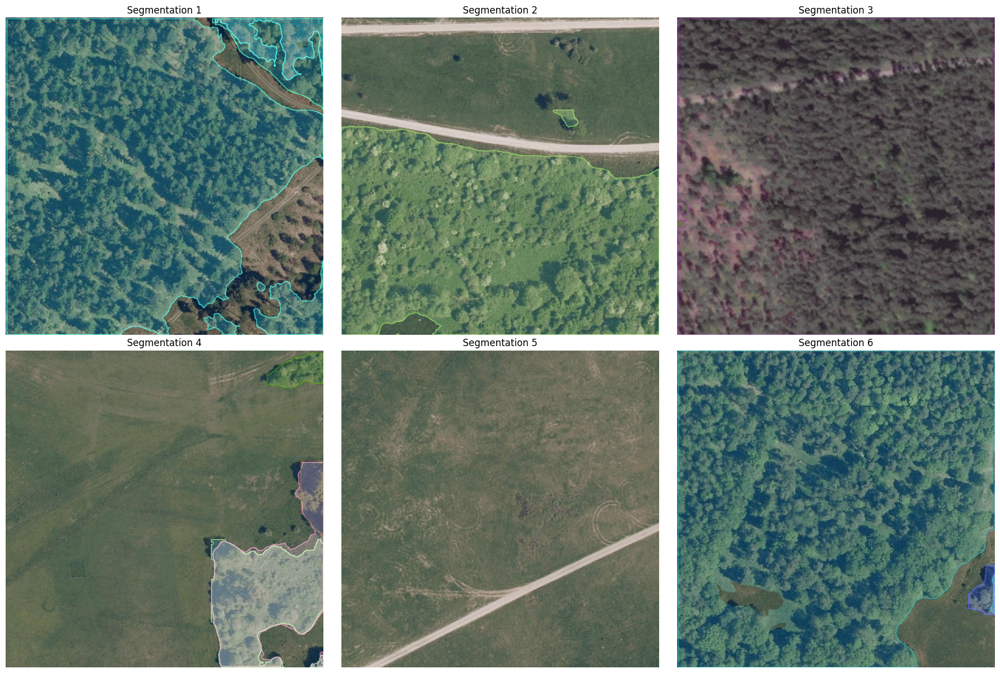

In [ ]:
print("\n=== Testing Vegetation Segmentation ===")

test_images = list(val_img_path.glob('*.jpg'))[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_path in enumerate(test_images):
    results = best_model.predict(str(img_path), conf=0.25)

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    overlay = img.copy()

    # Draw segmentation masks
    for result in results:
        if result.masks is not None:
            for i, mask in enumerate(result.masks.data):
                mask_resized = cv2.resize(mask.cpu().numpy(), (w, h))
                color = tuple(np.random.randint(0, 255, 3).tolist())

                # Apply mask
                colored_mask = np.zeros_like(img)
                colored_mask[mask_resized > 0.5] = color
                overlay = cv2.addWeighted(overlay, 1, colored_mask, 0.5, 0)

                # Draw contour
                contours, _ = cv2.findContours((mask_resized > 0.5).astype(np.uint8),
                                              cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                cv2.drawContours(img, contours, -1, color, 2)

    result_img = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

    axes[idx].imshow(result_img)
    axes[idx].set_title(f"Segmentation {idx+1}")
    axes[idx].axis('off')

plt.tight_layout()
plt.savefig('vegetation_test_predictions.png', dpi=300, bbox_inches='tight')
plt.show()

Save Model and Export Results

In [ ]:
print("\n=== Saving Model and Results ===")

# Export model
best_model.export(format='onnx')

# Save metrics
metrics_dict = {
    'box_mAP50': float(val_results.box.map50),
    'box_mAP50-95': float(val_results.box.map),
    'mask_mAP50': float(val_results.seg.map50),
    'mask_mAP50-95': float(val_results.seg.map),
    'precision': float(val_results.box.mp),
    'recall': float(val_results.box.mr),
    'mean_iou': float(np.mean(iou_scores)),
    'mean_dice': float(np.mean(dice_scores)),
    'classes': VEGETATION_CLASSES
}

with open('vegetation_segmentation_metrics.json', 'w') as f:
    json.dump(metrics_dict, f, indent=4)

print("Model saved successfully!")
print(f"Best weights: runs/segment/vegetation_segmentation/weights/best.pt")
print(f"ONNX model: runs/segment/vegetation_segmentation/weights/best.onnx")
print(f"Metrics saved to: vegetation_segmentation_metrics.json")

print("\n=== Vegetation Segmentation Training Complete ===")


=== Saving Model and Results ===
Ultralytics 8.3.246 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from 'runs/segment/vegetation_segmentation/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (6.5 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 14 packages in 180ms
Prepared 6 packages in 8.56s
Installed 6 packages in 378ms
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.20.0
 + onnxruntime-gpu==1.23.2
 + onnxslim==0.1.82

requirements: AutoUpdate success ✅ 9.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx

Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 


ONNX: slimming with onnxslim 0.1.82...
ONNX: export success ✅ 11.9s, saved as 'runs/segment/vegetation_segmentation/weights/best.onnx' (12.7 MB)

Export complete (12.4s)
Results saved to /content/runs/segment/vegetation_segmentation/weights
Predict:         yolo predict task=segment model=runs/segment/vegetation_segmentation/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=runs/segment/vegetation_segmentation/weights/best.onnx imgsz=640 data=/content/vegetation-segmentation-4/data.yaml  
Visualize:       https://netron.app
Model saved successfully!
Best weights: runs/segment/vegetation_segmentation/weights/best.pt
ONNX model: runs/segment/vegetation_segmentation/weights/best.onnx
Metrics saved to: vegetation_segmentation_metrics.json

=== Vegetation Segmentation Training Complete ===


### Upload a Custom Image for Testing

Use the following cell to upload an image from your local machine. Once uploaded, the model will perform segmentation on it.

In [ ]:
from google.colab import files
import io

# Upload file from your local system
uploaded = files.upload()

# Get the filename of the uploaded image
for fn in uploaded.keys():
    uploaded_image_path = fn
    print(f"User uploaded file \" {uploaded_image_path}" )

if 'uploaded_image_path' in locals():
    print(f"Image '{uploaded_image_path}' uploaded successfully.")
else:
    print("No image was uploaded.")

Saving vegseg_sample.jpg to vegseg_sample.jpg
User uploaded file " vegseg_sample.jpg
Image 'vegseg_sample.jpg' uploaded successfully.


### Perform Inference and Visualize on Uploaded Image


=== Predicting on uploaded image: vegseg_sample.jpg ===


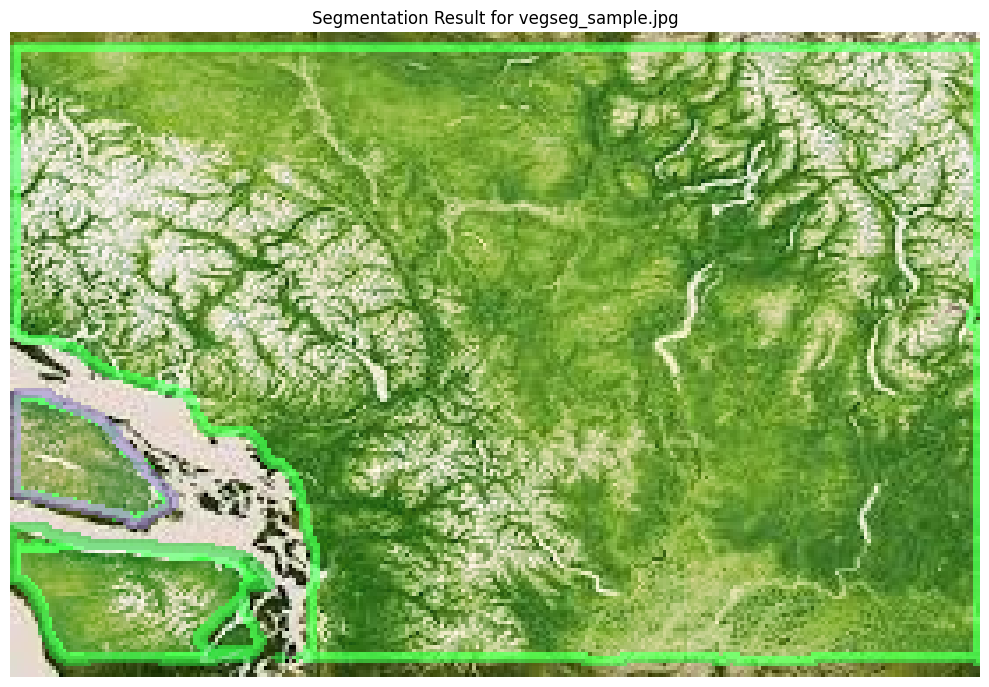

In [ ]:
if 'uploaded_image_path' not in locals():
    print("⚠️ Please upload an image in the previous cell first.")
elif best_model is None:
    print("⚠️ Model not loaded. Please ensure training completed and model is loaded.")
else:
    print(f"\n=== Predicting on uploaded image: {uploaded_image_path} ===")

    # Perform prediction
    results = best_model.predict(uploaded_image_path, conf=0.25)

    # Load and process the image for visualization
    img = cv2.imread(uploaded_image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    overlay = img.copy()

    # Draw segmentation masks
    for result in results:
        if result.masks is not None:
            for i, mask in enumerate(result.masks.data):
                mask_resized = cv2.resize(mask.cpu().numpy(), (w, h))
                color = tuple(np.random.randint(0, 255, 3).tolist())

                # Apply mask
                colored_mask = np.zeros_like(img)
                colored_mask[mask_resized > 0.5] = color
                overlay = cv2.addWeighted(overlay, 1, colored_mask, 0.5, 0)

                # Draw contour
                contours, _ = cv2.findContours((mask_resized > 0.5).astype(np.uint8),
                                              cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                cv2.drawContours(img, contours, -1, color, 2)

    result_img = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

    plt.figure(figsize=(10, 10))
    plt.imshow(result_img)
    plt.title(f"Segmentation Result for {uploaded_image_path}")
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(f"prediction_{Path(uploaded_image_path).name}", dpi=300, bbox_inches='tight')
    plt.show()